##  <center>               **Structured Products: Autocall Pricer** March 2022
##  <center>  Magistere BFA 3
##  <center>            Thomas Burgat - Alexis Pauthonier


In [1]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from math import *

# **1. MC Simulations**

**1.1 Black Scholes Monte Carlo Simulation**

In [2]:
# step 1: create a matrix a MC simulator, under the form of a matrix with format (nb_simulations,step_size).

def BS_Generator(spot_price, maturity, r, q, sigma, nb_paths):
  
  rnd_matrix = np.random.normal(0, 1, (nb_paths, maturity * 252)) * sigma / np.sqrt(252) + (r - q - (sigma**2) / 2) / 252
  exp_rnd_matrix = np.exp(rnd_matrix) 
  MC_simulator = np.cumprod(np.c_[np.ones(nb_paths) * spot_price, exp_rnd_matrix], axis=1)

  return pd.DataFrame(MC_simulator)

In [3]:
#check that the spot prices at maturity look coherent through an example

spot_price = 100
maturity = 1
r = 0.0
q = 0
sigma = 0.2
nb_paths = 10000

BS_spot_diffusion = BS_Generator(spot_price, maturity, r, q, sigma, nb_paths)

#display the data frame at different dates (every 252/4 dates means every quarter)
BS_spot_diffusion.iloc[:,[ i for i in BS_spot_diffusion.columns if i % int( 252 / 4 )==0 ]]

,0,63,126,189,252
0,100.0,94.847401,95.255684,85.866905,68.840295
1,100.0,105.149601,103.576487,109.030103,103.035882
2,100.0,108.713670,94.173060,77.030628,70.496680
3,100.0,107.763625,122.587810,131.667635,133.339717
4,100.0,123.284210,143.045946,152.537131,166.577115
...,...,...,...,...,...
9995,100.0,103.793723,112.043275,117.291938,125.339314
9996,100.0,80.338954,82.557208,78.164085,76.620468
9997,100.0,93.162247,102.939429,112.492060,110.023114
9998,100.0,96.667969,96.814283,109.966927,93.864476


In [4]:
Call = np.average(np.maximum(BS_spot_diffusion.iloc[:,-1] -100,0))
Call

8.129519956872702

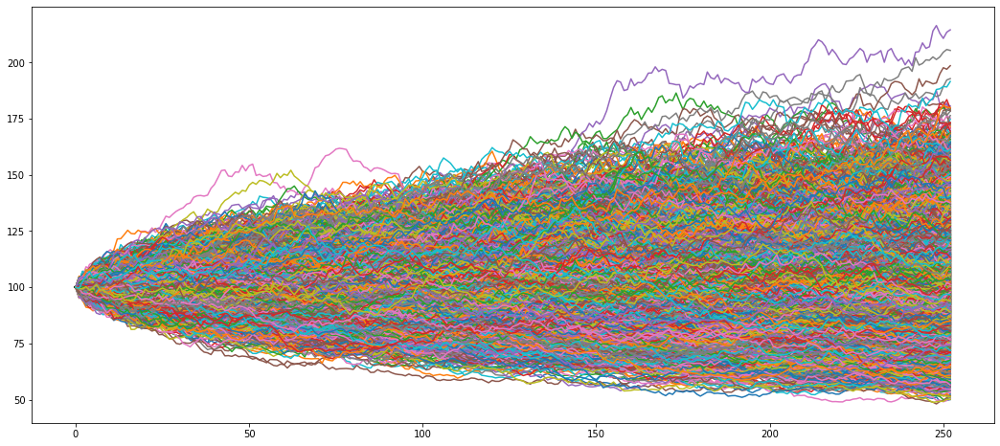

In [5]:
#Plot the spot diffusion
plt.figure(figsize=(18,8))
plt.plot(BS_spot_diffusion.T)
plt.show()

**1.2 Black Scholes with Stochastic Rates Monte Carlo Simulation**

For this implementation, we assume that spot and rates follow the diffusions below:

Spot diffusion:
\begin{align}
        \frac{dS_t}{ S_t}= r_tdt + \sigma_1dB_t^1 
    \end{align}

Rates diffusion: 
\begin{align}
        dr_t= a(\theta- r_t) + \sigma_2dB_t^2 
    \end{align}
and
\begin{align}
        cov(dB_t^1 ,dB_t^2) = \rho dt 
    \end{align}
where 
\begin{align} 
  B_t^1   and   B_t^2 
  \end{align}
  are standard brownian motions

In [6]:
#step 2: create a MC simulator, under the form of a matrix with format (nb_simulations,step_size), with stochastic rates model

def correlated_draws(nb_paths,correl,maturity):
  ''' this function returns a tuple of two matrix of size (nb_paths,maturity*252) 
      with correlated draws.
      Parameters:
      nb_paths: int the number of paths to simulate
      maturity: int maturity in years
      correl: the correlation between the two matrix
  '''
  common_factor = np.random.normal(0, 1, (nb_paths, maturity * 252))
  factor1 = np.random.normal(0, 1, (nb_paths, maturity * 252))
  factor2 = np.random.normal(0, 1, (nb_paths, maturity * 252))

  stock_rnd_draws = correl*common_factor+np.sqrt(1 - correl**2)*factor1
  rates_rnd_draws = correl*common_factor+np.sqrt(1 - correl**2)*factor2

  return rates_rnd_draws,stock_rnd_draws

def rates_diffusion(rates_rnd_draws,initial_rate,speed_reversion,LT_rate_level,sigmar):
  ''' this function returns a matrix of size (nb_paths,maturity*252)
        Each row represents one path of the rates diffusion 
        Parameters:
        rates_rnd_draws: ndarray of size(nb_paths, maturity 252)
        initial rate: float 
        speed reversion: float parameter a in the rates diffusion above
        LT_rate_level: float parameter theta in the rates diffusion above
  '''
  nb_paths = rates_rnd_draws.shape[0]
  rates_paths = np.c_[np.ones(nb_paths) * initial_rate, np.zeros(rates_rnd_draws.shape)]
  for col in range(1,rates_paths.shape[1]):
    rates_paths[:,col] = rates_paths[:,col-1] + speed_reversion *(LT_rate_level-rates_paths[:,col-1]) * 1/252 + sigmar* 1/np.sqrt(252) * rates_rnd_draws[:,col-1]

  return rates_paths

def BS_Generator_sto_rates(spot_price, maturity, sto_rates,stock_rnd_draws,q, sigma, nb_paths):
  ''' this function returns a matrix of size (nb_paths,maturity*253)
      Each row represents one path of the spot diffusion 
      Parameters:
      spot_price: float initial spot price
      maturity: maturity of the diffusion
      sto_rates: ndarray of size(nb_paths, maturity 252) representing the rates diffusion
      q: float dividend rate
      sigma: float volatility of the underlying
      nb_paths: int the number of paths simulation
  '''  
  #rnd_matrix = np.random.normal(0, 1, (nb_paths, maturity*252)) * sigma / np.sqrt(252) + (sto_rates[:,:-1] - q - (sigma**2)/2) / 252
  rnd_matrix = stock_rnd_draws * sigma / np.sqrt(252) + (sto_rates[:,:-1] - q - (sigma**2)/2) / 252
  exp_rnd_matrix = np.exp(rnd_matrix) 
  MC_simulator = np.cumprod(np.c_[np.ones(nb_paths) * spot_price, exp_rnd_matrix], axis=1)

  return pd.DataFrame(MC_simulator)



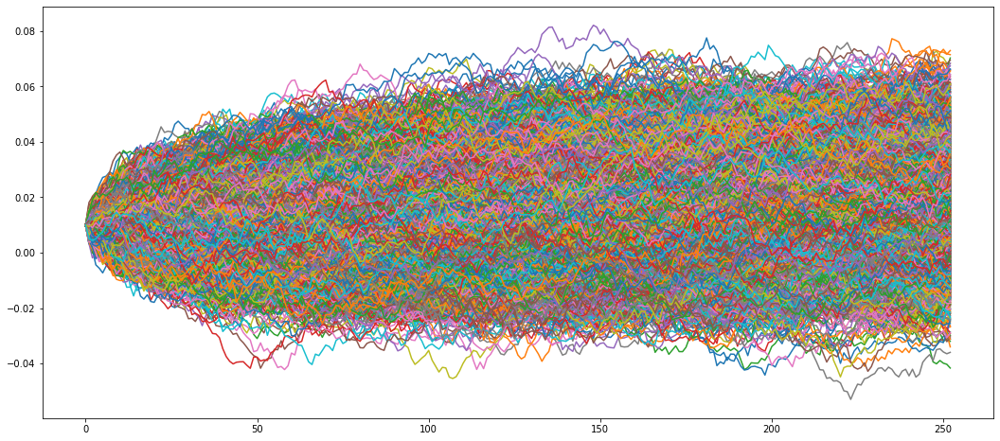

In [7]:
#plot of the rates paths

nb_paths = 10000
correl = -0.4
maturity = 1
rates_rnd_draws,stock_rnd_draws = correlated_draws(nb_paths,correl,maturity)

initial_rate = 0.01
speed_reversion = 2
LT_rate_level = 0.02
sigmar = 0.03

rates_diff = rates_diffusion(rates_rnd_draws,initial_rate,speed_reversion,LT_rate_level,sigmar)
plt.figure(figsize=(18,8))
plt.plot(rates_diff.T)
plt.show()

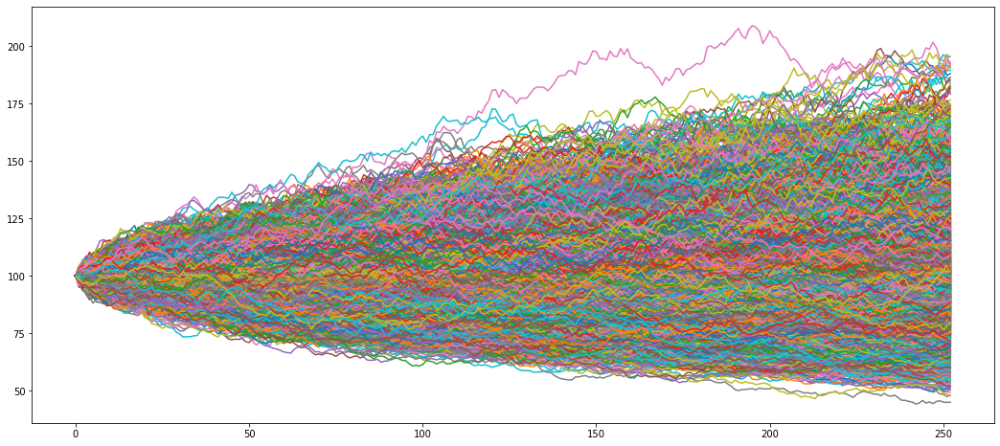

In [8]:
#plot of the spot paths

spot_price = 100
q = 0.01
sigma = 0.2
BS_StoR_spot_diffusion=BS_Generator_sto_rates(spot_price, maturity, rates_diff, stock_rnd_draws, q, sigma, nb_paths)
plt.figure(figsize=(18,8))
plt.plot(BS_StoR_spot_diffusion.T)
plt.show()

In [9]:
# quick check that for a vanilla call, prices are in the same magnitude

def BS_MC_call_pricer(spot_diffusion,strike,r,maturity):
  last_spot = spot_diffusion.iloc[:,-1]
  final_payoff = np.maximum( last_spot-strike, np.zeros(last_spot.shape[0]) )
  discounted_final_payoff = np.exp(-r * maturity) * final_payoff

  return np.mean(discounted_final_payoff)

def BS_MC_StoR_call_pricer(spot_diffusion,strike,rates_diffusion,maturity):
  avg_rate = rates_diffusion.mean(axis=1)
  last_spot = spot_diffusion.iloc[:,-1]
  final_payoff = np.maximum( last_spot-strike, np.zeros(last_spot.shape[0]) )
  discounted_final_payoff = np.exp(-avg_rate * maturity) * final_payoff

  return np.mean(discounted_final_payoff)

 Let's analyse the impact of the correlation between spot and rates on the call price

In [10]:
strike = 100

price = BS_MC_call_pricer(BS_spot_diffusion,strike,r,maturity)
print('BS price = ',price)

price_sto = BS_MC_StoR_call_pricer(BS_StoR_spot_diffusion,strike,rates_diff,maturity)
print('BS with sto rates price = ', price_sto)


BS price =  8.129519956872711
BS with sto rates price =  8.040628912445294


#**2. MC Autocall Pricer**

In [11]:
#Pricing of the autocall product

def autocall_pricer(MC_matrix,discount_rate,maturity,cpn_freq_per_year,cpn_rate,cpn_barrier,recall_barrier,pdi_barrier):
  '''
    This function returns the price of an autocall with following parameters:
    MC_matrix: (nb_paths,maturity*252) size ndarray, each row of this array represents a random path
    discount_rate: int
    maturity: float, expressed in years
    cpn_freq_per_year: int, nb of coupons in a year
    cpn_rate: float, coupon size, in percent of the principal
    cpn_barrier: float, in percent of the principal 
    recall_barrier: float, in percent of the principal 
    pdi_barrier: float, in percent of the principal 

  '''
  try: # check that the diffusion period has a maturity longer or equal than the payoff
    if MC_matrix.shape[1]-1 < 252 * maturity:
        raise TypeError("Please use a diffusion over a period of at least {} years".format(maturity))
  except Exception as e:
    print("Exception : "+ repr(e))


  MC_matrix = MC_matrix.iloc[:,:252*maturity]
  MC_matrix = MC_matrix.iloc[:, [ i for i in MC_matrix.columns if ( i % int( (252-1) / cpn_freq_per_year ) == 0 and i>0)] ]
  discount = np.array([np.exp(-discount_rate*t/252) for t in MC_matrix.columns ])
  MC_array = MC_matrix.to_numpy()
  nb_simul = MC_array.shape[0]
  price = 0

  for i in range(nb_simul):
    path = MC_array[i,:]
    recall = np.where(path > recall_barrier*100)[0]

    if len(recall) >= 1: #product is recalled
         recall_date = recall[0]
         cpn_index = np.where(path[:recall_date + 1] > cpn_barrier*100)[0] 
         if cpn_index[0] != 0:   #recall after first observation date
           cpn = np.zeros((1,cpn_index[-1]+1))
           cpn[0,cpn_index] = cpn_rate*100
           cpn[0,-1] = cpn[0, -1] + 100
           discounted_cpn = discount[:recall_date + 1] * cpn
           #print('recall ',discounted_cpn[0])
           price += sum(discounted_cpn[0])

         else: #recall on first observation date
          price +=(100+cpn_rate*100)*discount[0]

    else:  #product is not recalled
      cpn = np.zeros((1,len(path[:])))
      cpn_index = np.where(path[:]>cpn_barrier*100)[0]
      cpn[0,cpn_index] = cpn_rate * 100

      if path[-1] < pdi_barrier*100: #product touches PDI_barrier
        cpn[0,-1] = path[-1]+cpn[0,-1]
        discounted_cpn = discount*cpn
        #print('no recall + PDI activation ',discounted_cpn[0])
        price += sum(discounted_cpn[0])

      else: #product does not touch PDI_barrier
       cpn[0,-1] = cpn[0,-1] + 100
       discounted_cpn = discount * cpn
       #print('no recall + no PDI activation ',discounted_cpn[0])
       price += sum(discounted_cpn[0])

  return price / nb_simul

ac_pricer1 = autocall_pricer(MC_matrix=BS_spot_diffusion,discount_rate=0.02,maturity=1,cpn_freq_per_year=2,cpn_rate=0.04,cpn_barrier=1,recall_barrier=1,pdi_barrier=0.8)
ac_pricer2 = autocall_pricer(MC_matrix=BS_spot_diffusion,discount_rate=0.02,maturity=1,cpn_freq_per_year=2,cpn_rate=0.04,cpn_barrier=0.8,recall_barrier=1,pdi_barrier=0.8)
print('BS Model:', '\n','ac_pricer1 = ',ac_pricer1,' ac_pricer2 = ',ac_pricer2)

ac_pricer1 = autocall_pricer(MC_matrix=BS_StoR_spot_diffusion,discount_rate=0.02,maturity=1,cpn_freq_per_year=2,cpn_rate=0.04,cpn_barrier=1,recall_barrier=1,pdi_barrier=0.8)
ac_pricer2 = autocall_pricer(MC_matrix=BS_StoR_spot_diffusion,discount_rate=0.02,maturity=1,cpn_freq_per_year=2,cpn_rate=0.04,cpn_barrier=0.8,recall_barrier=1,pdi_barrier=0.8)
print('BS with Sto Rates Model:','\n', 'ac_pricer1 = ',ac_pricer1,' ac_pricer2 = ',ac_pricer2)

BS Model: 
 ac_pricer1 =  97.04338443779122  ac_pricer2 =  99.58991170631386
BS with Sto Rates Model: 
 ac_pricer1 =  97.03144403341383  ac_pricer2 =  99.51426097250933


## Autocall pricer including snowball/memory effect

In [12]:
#Pricing of the autocall product including snowball/memory effect


def autocall_pricer_adv(MC_matrix,discount_rate,maturity,cpn_freq_per_year,cpn_rate,cpn_barrier,recall_barrier,pdi_barrier,memory):
  '''
    This function returns the price of an autocall with following parameters:
    MC_matrix: (nb_paths,maturity*252) size ndarray, each row of this array represents a random path
    discount_rate: int
    maturity: float, expressed in years
    cpn_freq_per_year: int, nb of coupons in a year
    cpn_rate: float, coupon size, in percent of the principal
    cpn_barrier: float, in percent of the principal 
    recall_barrier: float, in percent of the principal 
    pdi_barrier: float, in percent of the principal
    memory: boolean, coupons not paid can be paid later 

  '''
  try: # check that the diffusion period has a maturity longer or equal than the payoff
    if MC_matrix.shape[1]-1 < 252 * maturity:
        raise TypeError("Please use a diffusion over a period of at least {} years".format(maturity))
  except Exception as e:
    print("Exception : "+ repr(e))

  MC_matrix = MC_matrix.iloc[:,:252*maturity]
  MC_matrix = MC_matrix.iloc[:, [ i for i in MC_matrix.columns if ( i % int( (252-1) / cpn_freq_per_year ) == 0 and i>0)] ]
  discount = np.array([np.exp(-discount_rate*t/253) for t in MC_matrix.columns ])
  MC_array = MC_matrix.to_numpy()
  nb_simul = MC_array.shape[0]
  price =  0

  for i in range(nb_simul): # for each simulation we calculate the stream of discounted cashflows and increment the variable price
    path = MC_array[i,:]
    #print(path)
    recall = np.where(path>recall_barrier*100)[0]

    if len(recall) >= 1: #product is recalled
         recall_date=recall[0]
         cpn_index = np.where(path[:recall_date+1]>=cpn_barrier*100)[0]

         if len(cpn_index) != 0:   #recall after first observation date
           cpn=np.zeros((1,cpn_index[-1]+1))

           if memory == True:
             for i in cpn_index[1:]:
               j = cpn_index[np.where(cpn_index==i)[0]-1][0]
               cpn[0,i] = (i-j) * cpn_rate*100
             cpn[0,cpn_index[0]] = (cpn_index[0]+1) * cpn_rate*100

           else:
            cpn[0,cpn_index] = cpn_rate * 100

           cpn[0,-1] = cpn[0,-1] + 100
           discounted_cpn = discount[:recall_date+1] * cpn
           #print('recall ',cpn[0])

           price += sum(discounted_cpn[0])

         else: #recall on first observation date
          price += (100 + cpn_rate*100) * discount[0]
          #print('direct recall ',[100+cpn_rate*100])

    else:  #product is not recalled
      cpn = np.zeros((1,len(path[:])))
      cpn_index = np.where(path[:] >= cpn_barrier*100)[0]
      

      if path[-1] < pdi_barrier*100: #product touches PDI_barrier
          if memory == True:
            if len(cpn_index) > 0:   
              for i in cpn_index[1:]:
                j = cpn_index[np.where(cpn_index == i)[0]-1][0]
                cpn[0,i] = (i-j) * cpn_rate * 100
              cpn[0,cpn_index[0]] = (cpn_index[0]+1) * cpn_rate * 100

          else:
            cpn[0,cpn_index] = cpn_rate * 100

          cpn[0,-1] = path[-1] + cpn[0,-1]
          discounted_cpn = discount * cpn
          #print('no recall + PDI activation ',cpn[0])
          price += sum(discounted_cpn[0])
 
      elif path[-1]<cpn_barrier*100: #product does not touch PDI_barrier and ends under cpn_barrier
        if memory == True:
          if len(cpn_index)>0:   
            for i in cpn_index[1:]:
              j = cpn_index[np.where(cpn_index == i)[0]-1][0]
              cpn[0,i] = (i-j) * cpn_rate * 100
            cpn[0,cpn_index[0]] = (cpn_index[0]+1) * cpn_rate * 100         
        else:
           cpn[0,cpn_index] = cpn_rate * 100 
          
        cpn[0,-1] = cpn[0,-1] + 100
        discounted_cpn = discount * cpn
        #print('no recall + no PDI activation + no final coupon ',cpn[0])
        price += sum(discounted_cpn[0])

      else: #product does not touch PDI_barrier and ends over cpn_barrier       
        if memory == True:
          if len(cpn_index)>0:     
            for i in cpn_index[1:]:
              j = cpn_index[np.where(cpn_index == i)[0]-1][0]
              cpn[0,i] = (i-j) * cpn_rate*100
            cpn[0,cpn_index[0]] = (cpn_index[0]+1) * cpn_rate * 100
        else:
          cpn[0,cpn_index] = cpn_rate * 100
 
        cpn[0,-1] = cpn[0,-1] + 100
        discounted_cpn = discount * cpn
        #print('no recall + no PDI activation +coupons ',cpn[0])
        price += sum(discounted_cpn[0])
     
       
  return price / nb_simul

ac_pricer1_BS = autocall_pricer_adv(MC_matrix=BS_spot_diffusion, discount_rate=0.02, maturity=1, cpn_freq_per_year=2, cpn_rate=0.04, cpn_barrier=1, recall_barrier=1, pdi_barrier=0.8, memory=True)
ac_pricer2_BS = autocall_pricer_adv(MC_matrix=BS_spot_diffusion,discount_rate=0.02,maturity=1,cpn_freq_per_year=2,cpn_rate=0.04,cpn_barrier=0.8,recall_barrier=1,pdi_barrier=0.8,memory=True)

ac_pricer1_StoR = autocall_pricer_adv(MC_matrix=BS_StoR_spot_diffusion,discount_rate=0.02,maturity=1,cpn_freq_per_year=2,cpn_rate=0.04,cpn_barrier=1,recall_barrier=1,pdi_barrier=0.8,memory=True)
ac_pricer2_StoR = autocall_pricer_adv(MC_matrix=BS_StoR_spot_diffusion,discount_rate=0.02,maturity=1,cpn_freq_per_year=2,cpn_rate=0.04,cpn_barrier=0.8,recall_barrier=1,pdi_barrier=0.8,memory=True)

print('BS Model:', '\n','ac_pricer1 = ',ac_pricer1_BS,' ac_pricer2 = ',ac_pricer2_BS)
print('BS with Sto Rates Model:','\n', 'ac_pricer1 = ',ac_pricer1_StoR,' ac_pricer2 = ',ac_pricer2_StoR)

BS Model: 
 ac_pricer1 =  97.52322461355604  ac_pricer2 =  100.02699289446205
BS with Sto Rates Model: 
 ac_pricer1 =  97.51792839925781  ac_pricer2 =  99.95788823641676


**Analysis of the results:**

We used a correlation of rho= -0.4 which means that when the spot is increasing, rates tend to decrease.

For the seller of the autocall, the increase in the spot means that the probability of recall is increasing, and therefore the expected maturity of the product is decreasing. So in order to be hedged the trader must sell the long maturity ZC he has to buy new ones with a shorter maturity. As a decrease in rates increases ZC prices, and as long maturity ZC price increase more than short maturity ZC price for a parallel shift in ZC curve, the trader earns money on the reabalancing of the hedge if the correlation between spot and rate is negative. As a consequence, the price under sto rates is a decreasing when spot/rates correlation is negative.

That's why for negative correlation, autocall prices are less expensive using BS with stochastic rates compared to a simple BS model. 

#**3. PDE Autocall Pricer**

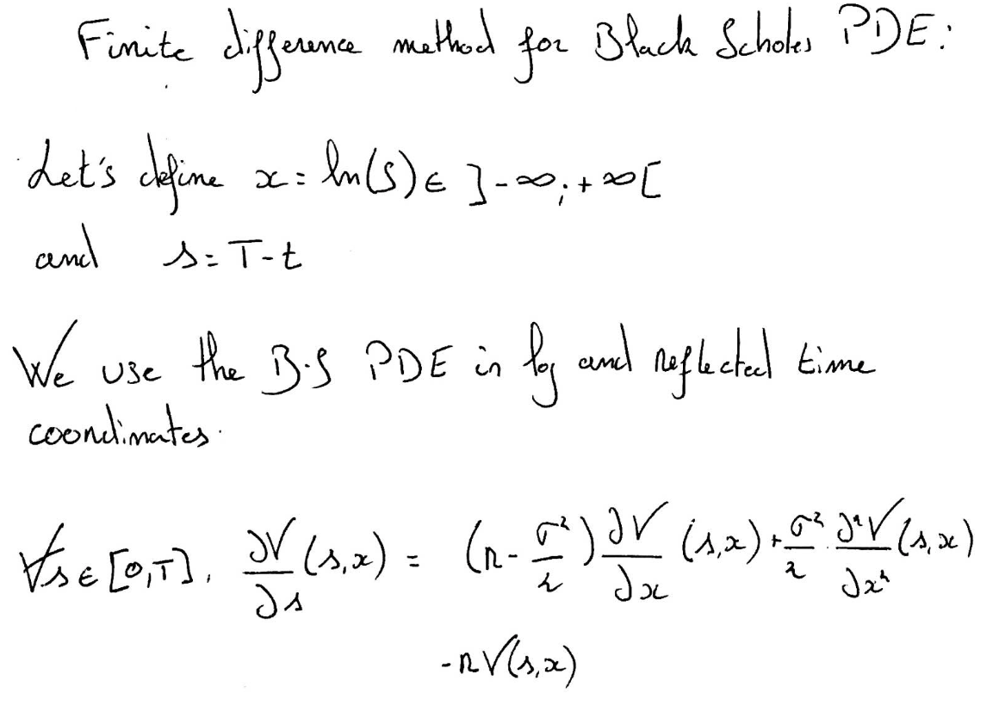

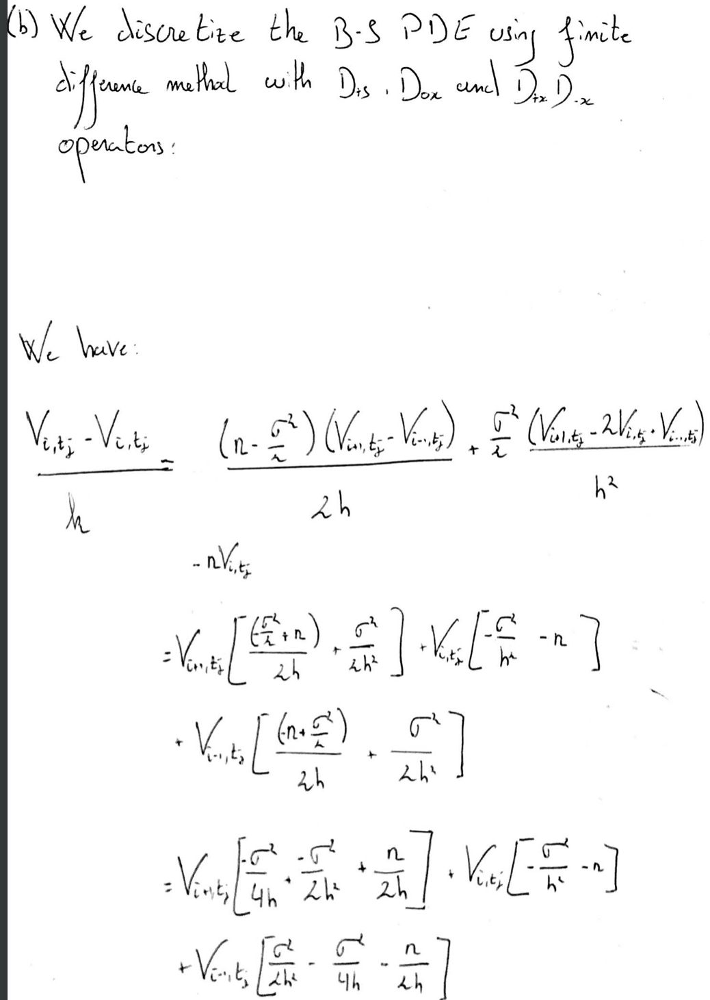

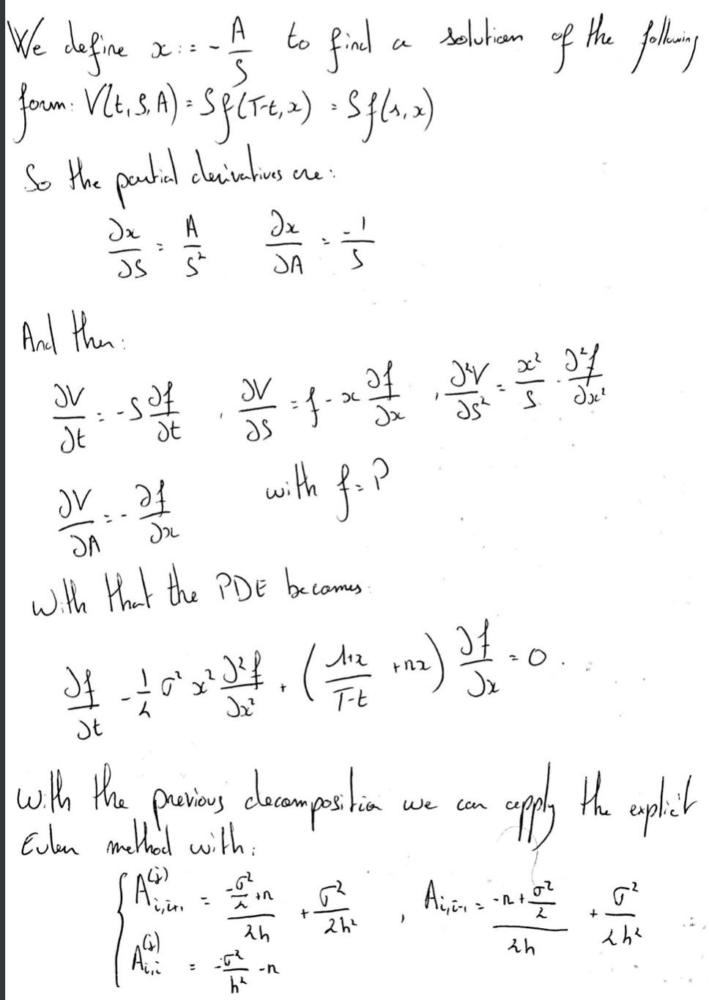

Quick test on a call option

We use the BS PDE in log space and reflected time (s = T-t)

We choose  X_min = 0 and X_max = 8 * vol * strike

For a call option we have the following boundary conditions:

- V(x,T) = Max(0,S - K)
- V(0,t) = 0
- V(x_max, t) = x_max - strike

Number of space points:  2650
Ratio k = 2.0006378394649182


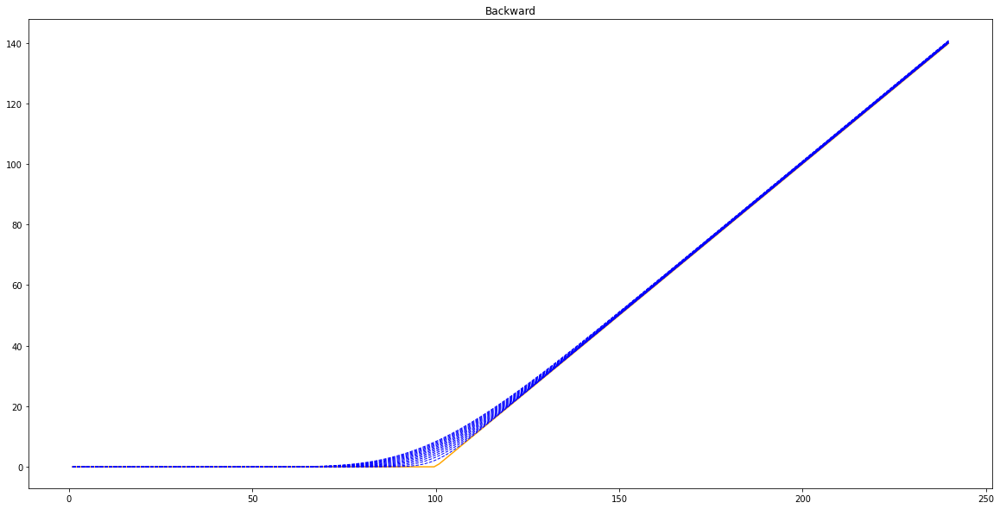

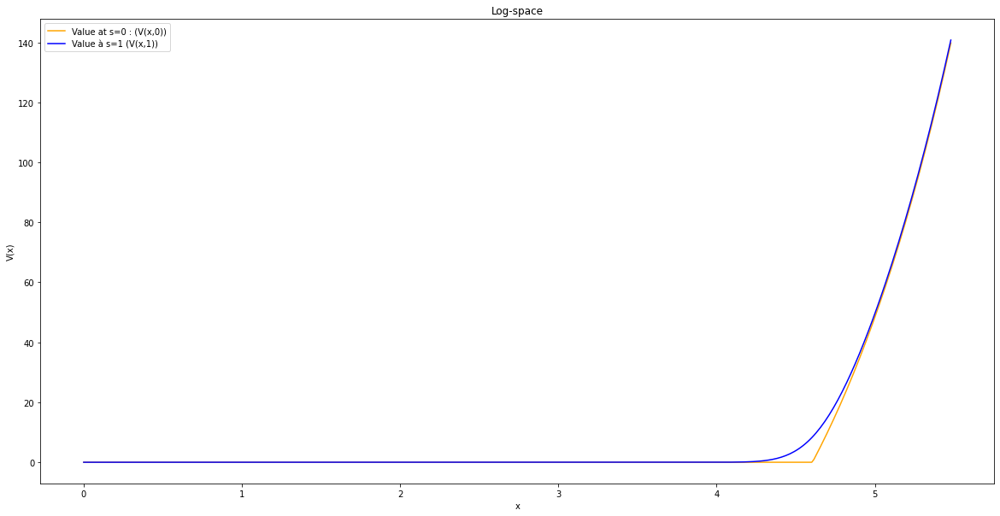

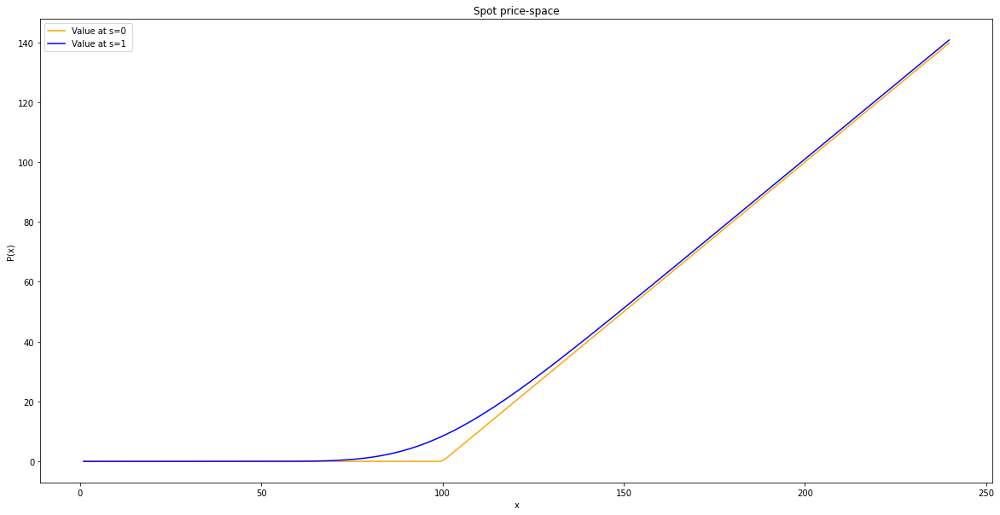

In [13]:
# Option params

T       = 1.0
r       = 0.01
strike  = 100
sigma   = 0.2

#PDE params
N       = 500                  #Number of Space points     
x_min   = log(1)
x_max   = log(strike*8*1.2)
h       = abs(x_max-x_min)/N   #Space Period 
J       = int(1/(2*h**2))      #Number of Time points 
deltaT  = T/J                  #Time Period

print('Number of space points: ', J)

#Therefore: DeltaT/h^2 is approximately equal to 2. 
print("Ratio k = " + str(deltaT/h**2))

#points du maillage en espace
x = np.linspace(x_min,x_max,N+1)

#Payoff
def g(x):
    return np.maximum(0,np.exp(x)-strike)

#Explicit Euler Method
def EE(A, k, F):
    B = np.eye(N+1) - k*A
    return np.dot(B,F)

#Backward

V0 = g(x)
V  = V0

S = np.exp(x)

plt.figure(num=None, figsize=(20,10), facecolor='w', edgecolor='k')
plt.plot(S[:400], V0[:400],  color='orange', linestyle='solid')

A = np.eye(N+1)
for i in range(1,N):
    A[i,i] = sigma**2/h**2 + r
    A[i,i+1] = (-r + sigma**2/2 - sigma**2/h)/(2*h)
    A[i,i-1] = (r - sigma**2/2 - sigma**2/h)/(2*h)

for j in range(int(J)):
    V = EE(A , deltaT, V)  
    V[0] = 0                         #Left limit condition 
    V[N] = np.exp(x_max) - strike    #Right limit condition

    if (j + 1) % 200 == 0:
      plt.plot(S[:400], V[:400], color='blue', linestyle='dashed', linewidth=1)

plt.title("Backward")

#Plots

plt.figure(figsize = (20,10))
plt.plot(x[:400], V0[:400],  color='orange', linestyle='solid')
plt.plot(x[:400], V[:400],  color='blue', linestyle='solid')

plt.xlabel("x")
plt.ylabel("V(x)")
plt.title("Log-space")
plt.legend(["Value at s=0 : (V(x,0))", "Value à s=1 (V(x,1))"])
plt.show()


#Print of P(S,t) for t=0 and t=1

plt.figure(figsize = (20,10))
plt.xlabel("x")
plt.ylabel("P(x)")
plt.plot(S[:400], V0[:400],  color='orange', linestyle='solid')
plt.plot(S[:400], V[:400],  color='blue', linestyle='solid')
plt.legend(["Value at s=0 ", 'Value at s=1'])
plt.title("Spot price-space")
plt.show()

In [14]:
print("PDE call option price at S = " , np.round(S[np.where(S > 100)[0][0]-1],1) , " : " ,np.round(V[np.where(S > 100)[0][0]-1],2))
print("MC call option price at S = " , np.round(S[np.where(S > 100)[0][0]-1],1) , " : " ,np.round(
    BS_MC_call_pricer(BS_Generator(S[np.where(S > 100)[0][0]-1], int(T), r, 0, sigma, 100000)
    ,strike,r,T),2))

PDE call option price at S =  99.6  :  8.19
MC call option price at S =  99.6  :  8.14


For the autocall we put the following boundary conditions:

- V(x,T) = Autocall payoff (i.e PDI + digit)
- V(0,t) = 0. (for all t)
- V(x_max, t) = 100 + coupon. (for all t)
- V(x *, t *) = 100 + coupon. (for all observation dates t * and for all x * that are above the recall barrier)

Number of space points:  2650
ratio k = 2.0006378394649182


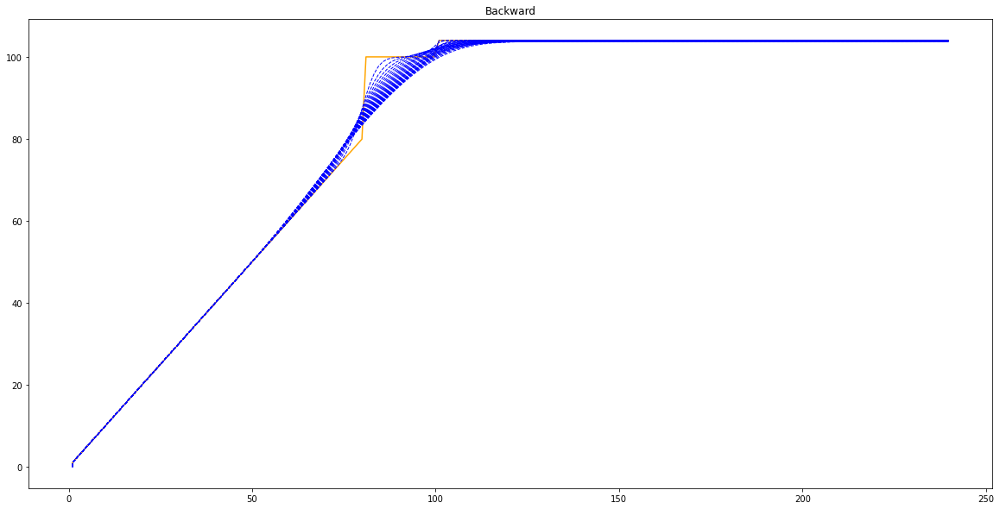

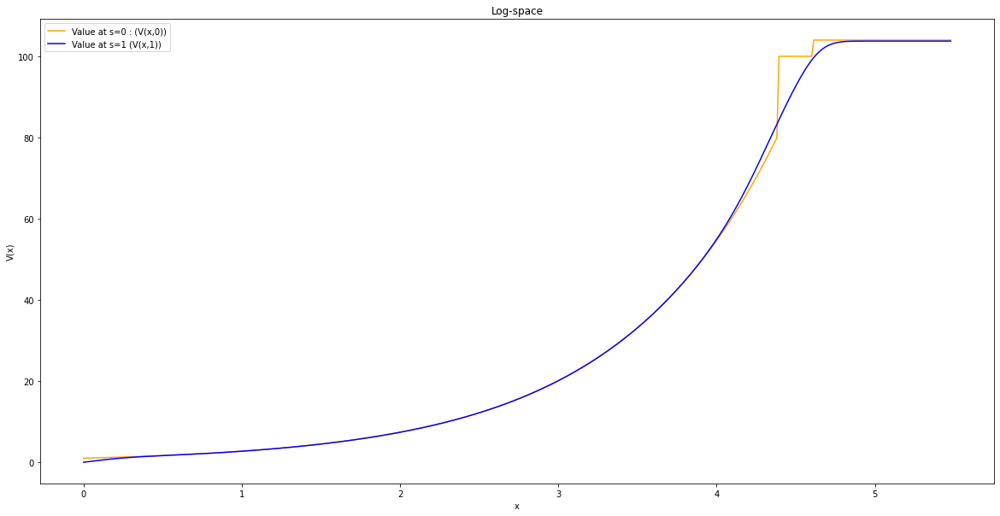

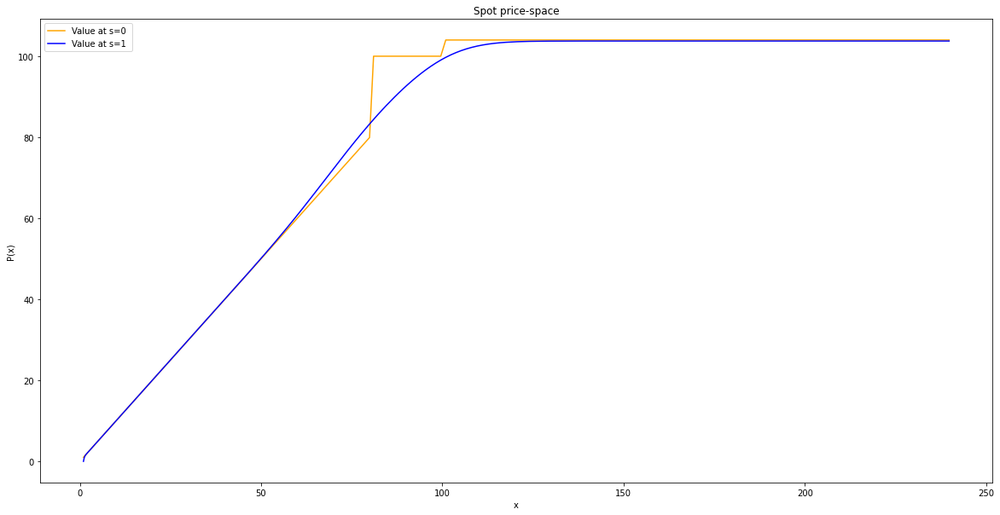

In [23]:
# Option params

T       = 1.0
r       = 0.01
strike  = 100
sigma   = 0.2
cpn_rate = 0.04
cpn_barrier = 1
recall_barrier = cpn_barrier
pdi_barrier = 0.8
cpn_freq_per_year = 4

#PDE params
N       = 500                  #Number of Space points     
x_min   = log(1)
x_max   = log(strike*8*1.2)
h       = abs(x_max-x_min)/N   #Space Period 
J       = int(1/(2*h**2))      #Number of Time points 
deltaT  = T/J                  #Time Period

print('Number of space points: ', J)

#Therefore: DeltaT/h^2 is approximately equal to 2. 
print("ratio k = " + str(deltaT/h**2))

#points du maillage en espace
x = np.linspace(x_min,x_max,N+1)

#payoff
def g(x):
  a = np.exp(x)
  a[np.where(np.exp(x) > pdi_barrier * 100)] = 100
  a[np.where(np.exp(x) > recall_barrier * 100)] = 100 + cpn_rate * 100
  return a


#Explicit Euler Method
def EE(A, k, F):
    B = np.eye(N+1) - k*A
    return np.dot(B,F)

#Backward

V0 = g(x)
V  = V0
Vs = dict()

S = np.exp(x)

plt.figure(num=None, figsize=(20,10), facecolor='w', edgecolor='k')
plt.plot(S[:400], V0[:400],  color='orange', linestyle='solid')


A = np.eye(N+1)
for i in range(1,N):
    A[i,i] = sigma**2/h**2 + r
    A[i,i+1] = (-r + sigma**2/2 - sigma**2/h)/(2*h)
    A[i,i-1] = (r - sigma**2/2 - sigma**2/h)/(2*h)

for j in range(int(J)):
    V = EE(A , deltaT, V)  
    V[0] = 0                         #Left limit condition 
    V[N] = 100 + cpn_rate * 100      #Right limit condition
    Vs[j] = V
    
    if j*deltaT % (1/cpn_freq_per_year) < 0.01:
      V[np.where(S > 100)[0][0]:] = 100 + cpn_rate * 100 

    if (j + 1) % 100 == 0:
      #print(V)
      plt.plot(S[:400], V[:400], color='blue', linestyle='dashed', linewidth=1)



plt.title("Backward")

#plots

plt.figure(figsize = (20,10))
plt.plot(x[:400], V0[:400],  color='orange', linestyle='solid')
plt.plot(x[:400], V[:400],  color='blue', linestyle='solid')

plt.xlabel("x")
plt.ylabel("V(x)")
plt.title("Log-space")
plt.legend(["Value at s=0 : (V(x,0))", "Value at s=1 (V(x,1))"])
plt.show()


#Print of P(S,t) for t=0 and t=1

plt.figure(figsize = (20,10))
plt.xlabel("x")
plt.ylabel("P(x)")
val_P_in = plt.plot(S[:400], V0[:400] , color='orange', linestyle='solid')
val_P_fin = plt.plot(S[:400], V[:400],  color='blue', linestyle='solid')
plt.legend(["Value at s=0 ", 'Value at s=1'])
plt.title("Spot price-space")
plt.show()

In [16]:
print("PDE AC price at S = " , np.round(S[np.where(S > 100)[0][0]-1],1) , " : " ,np.round(V[np.where(S > 100)[0][0]-1],2))
print("MC AC price at S = " , np.round(S[np.where(S > 100)[0][0]-1],1) , " : " ,np.round(
    autocall_pricer(MC_matrix = BS_Generator(S[np.where(S > 100)[0][0]-1], int(T), r, 0, sigma, 100000),
                    discount_rate=0.01, maturity=1, cpn_freq_per_year=4, cpn_rate=0.04, cpn_barrier=1, recall_barrier=1, pdi_barrier=0.8)))

PDE AC price at S =  99.6  :  99.04
MC AC price at S =  99.6  :  99.0


We can see our pde pricing is consistent with the MC pricing.

Little animation that shows the evolution of AC price through time

In [17]:
from matplotlib import rc
rc('animation', html='jshtml')

In [18]:
df = pd.DataFrame(Vs)

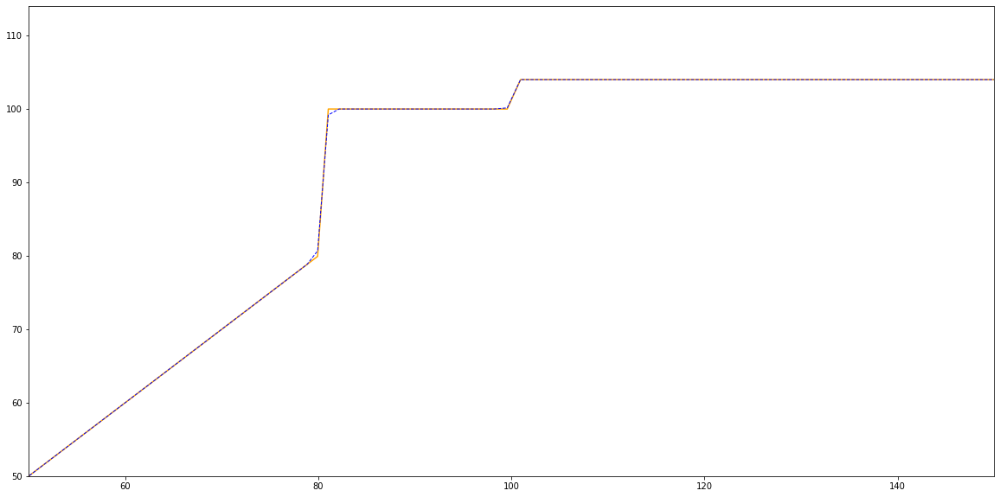

In [19]:
import matplotlib.animation as animation


fig = plt.figure(num=None, figsize=(20,10), facecolor='w', edgecolor='k')
plt.plot(S[:400], V0[:400],  color='orange', linestyle='solid')

line, = plt.plot([], [],color='blue', linestyle='dashed', linewidth=1) 


x_min   = log(1)
x_max   = log(strike*8*1.2)
cpn_rate = 0.04

plt.xlim(50, 150)
plt.ylim(50, cpn_rate*100+110)

def animate(j):


  line.set_data(S[:400], df.T.iloc[::10, :].iloc[j,:400])

  return line,
 
ani = animation.FuncAnimation(fig, animate, frames=int(J/10), blit=True, interval=20, repeat=False)

In [20]:
ani

We can clearly see on this animation that at each coupon payement date the gap sensitivity of the conditional digit can switch.

Contrainte Gamma

For that we have to price the concave envelop of the AC payoff. As an illustrative example we take the concave enveloppe for the specific AC priced earlier

Number of space points:  2650
ratio k = 2.0006378394649182


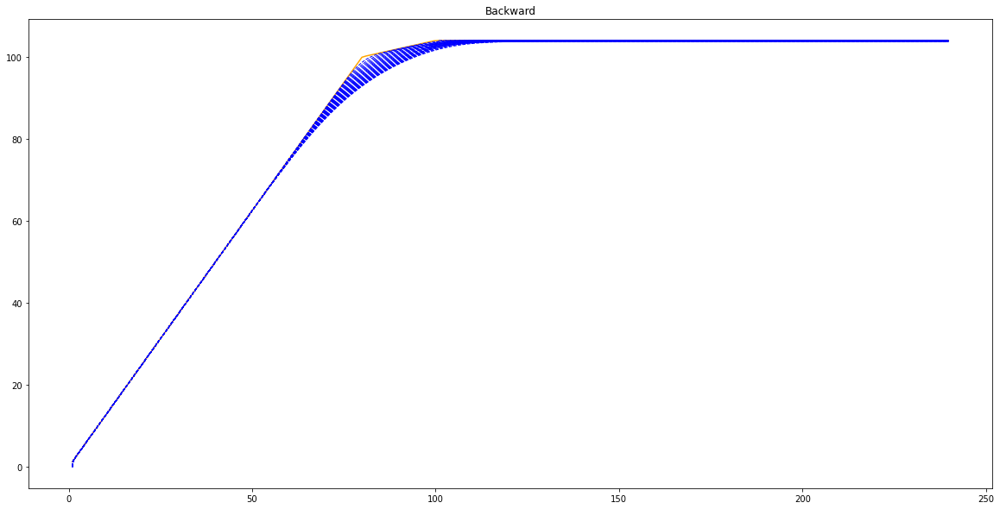

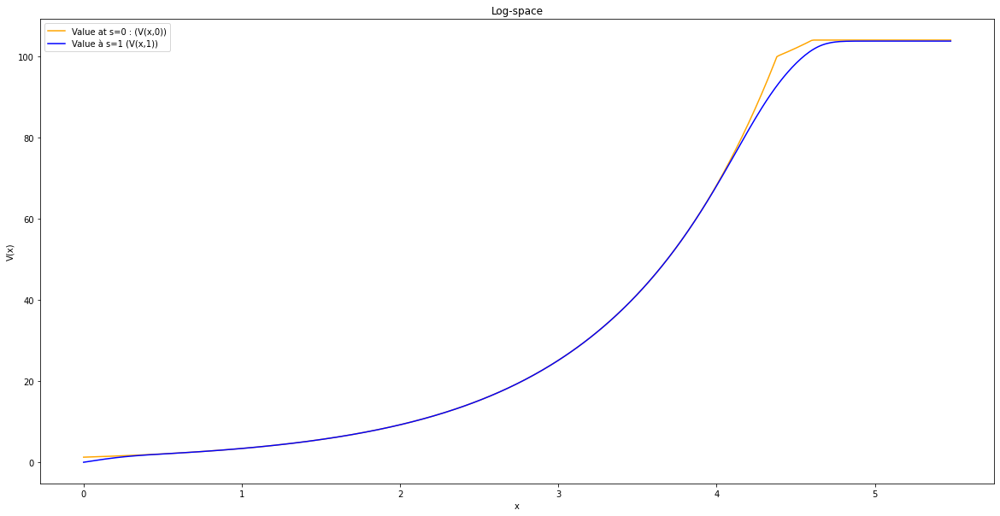

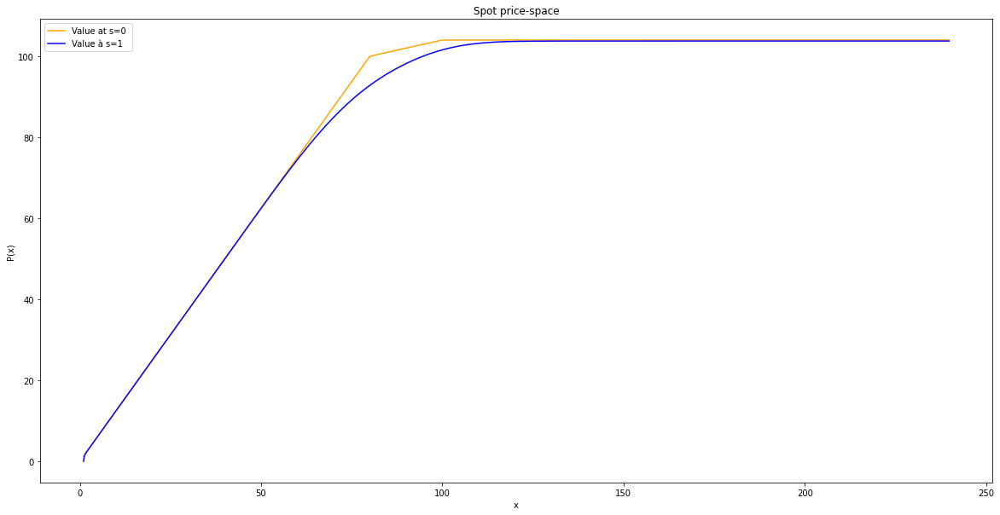

In [21]:
# Option params

T       = 1.0
r       = 0.01
strike  = 100
sigma   = 0.2
cpn_rate = 0.04
cpn_barrier = 1
recall_barrier = cpn_barrier
pdi_barrier = 0.8
cpn_freq_per_year = 4

#PDE params
N       = 500                  #Number of Space points     
x_min   = log(1)
x_max   = log(strike*8*1.2)
h       = abs(x_max-x_min)/N   #Space Period 
J       = int(1/(2*h**2))      #Number of Time points 
deltaT  = T/J                  #Time Period

print('Number of space points: ', J)

#Therefore: DeltaT/h^2 is approximately equal to 2. 
print("ratio k = " + str(deltaT/h**2))

#points du maillage en espace
x = np.linspace(x_min,x_max,N+1)

#payoff avec enveloppe concave (specific to pdi barrier = 80, recall barrier = cpn barrier = 100 & cpn rate = 4)
def g(x):
  a = np.exp(x)
  a[np.where(np.exp(x) > pdi_barrier * 100)] = 84 + 1/5*a[np.where(np.exp(x) > pdi_barrier * 100)]
  a[np.where(np.exp(x) > recall_barrier * 100)] = 100 + cpn_rate * 100
  a[np.where(np.exp(x) < pdi_barrier * 100)] = a[np.where(np.exp(x) < pdi_barrier * 100)] * recall_barrier / pdi_barrier


  return a


#Explicit Euler Method
def EE(A, k, F):
    B = np.eye(N+1) - k*A
    return np.dot(B,F)

#Backward

V0 = g(x)
V  = V0
Vs = dict()

S = np.exp(x)

plt.figure(num=None, figsize=(20,10), facecolor='w', edgecolor='k')
plt.plot(S[:400], V0[:400],  color='orange', linestyle='solid')


A = np.eye(N+1)
for i in range(1,N):
    A[i,i] = sigma**2/h**2 + r
    A[i,i+1] = (-r + sigma**2/2 - sigma**2/h)/(2*h)
    A[i,i-1] = (r - sigma**2/2 - sigma**2/h)/(2*h)

for j in range(int(J)):
    V = EE(A , deltaT, V)  
    V[0] = 0                         #Left limit condition 
    V[N] = 100 + cpn_rate * 100      #Right limit condition
    Vs[j] = V
    
    if j*deltaT % (1/cpn_freq_per_year) < 0.01:
      V[np.where(S > 100)[0][0]:] = 100 + cpn_rate * 100 

    if (j + 1) % 100 == 0:
      #print(V)
      plt.plot(S[:400], V[:400], color='blue', linestyle='dashed', linewidth=1)



plt.title("Backward")

#plots

plt.figure(figsize = (20,10))
plt.plot(x[:400], V0[:400],  color='orange', linestyle='solid')
plt.plot(x[:400], V[:400],  color='blue', linestyle='solid')

plt.xlabel("x")
plt.ylabel("V(x)")
plt.title("Log-space")
plt.legend(["Value at s=0 : (V(x,0))", "Value à s=1 (V(x,1))"])
plt.show()


#Print of P(S,t) for t=0 and t=1

plt.figure(figsize = (20,10))
plt.xlabel("x")
plt.ylabel("P(x)")
val_P_in = plt.plot(S[:400], V0[:400] , color='orange', linestyle='solid')
val_P_fin = plt.plot(S[:400], V[:400],  color='blue', linestyle='solid')
plt.legend(["Value at s=0 ", 'Value à s=1'])
plt.title("Spot price-space")
plt.show()

In [22]:
print("PDE AC price at S = " , np.round(S[np.where(S > 100)[0][0]-1],1) , " : " ,np.round(V[np.where(S > 100)[0][0]-1],2))

PDE AC price at S =  99.6  :  101.46


We can clearly see that constraining the gamma increase the price